In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import umap as umap

In [27]:
latent_dim=16
step_size=2
df=pd.read_csv(f'scaled_df_all_anomalies.csv')

In [28]:
m=4

params = {
    # Font family
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial'],

    # Font sizes
    "axes.labelsize": 10*m,
    "font.size": 10*m,
    "legend.fontsize": 10*m,
    "xtick.labelsize": 9*m,
    "ytick.labelsize": 9*m,

    # Style for axis labels (xlabel, ylabel)
    'axes.labelweight': 'bold',
    'axes.labelcolor': 'black',

    # General styles for other elements
    'font.weight': 'bold',       # Makes title, etc., bold
    'xtick.color': 'black',      # Sets tick label color
    'ytick.color': 'black',
    'legend.labelcolor': 'black'
}

plt.rcParams.update(params)

In [29]:
metals=['chem_metal_Sc', 'chem_metal_Ti',
       'chem_metal_V', 'chem_metal_Cr', 'chem_metal_Mn', 'chem_metal_Fe',
       'chem_metal_Co', 'chem_metal_Ni', 'chem_metal_Cu', 'chem_metal_Zn',
       'chem_metal_Y', 'chem_metal_Zr', 'chem_metal_Nb', 'chem_metal_Mo',
       'chem_metal_Tc', 'chem_metal_Ru', 'chem_metal_Rh', 'chem_metal_Pd',
       'chem_metal_Ag', 'chem_metal_Cd', 'chem_metal_Hf', 'chem_metal_Ta',
       'chem_metal_W', 'chem_metal_Re', 'chem_metal_Os', 'chem_metal_Ir',
       'chem_metal_Pt', 'chem_metal_Au', 'chem_metal_Hg', 'chem_metal_Al',
       'chem_metal_Ga', 'chem_metal_In', 'chem_metal_Sn', 'chem_metal_Pb',
       'chem_metal_Bi', 'chem_metal_La', 'chem_metal_Ce', 'chem_metal_Pr',
       'chem_metal_Nd', 'chem_metal_Sm', 'chem_metal_Eu', 'chem_metal_Gd',
       'chem_metal_Tb', 'chem_metal_Dy', 'chem_metal_Ho', 'chem_metal_Er',
       'chem_metal_Tm', 'chem_metal_Yb', 'chem_metal_Lu',]
nonmetals=['chem_num_atoms',
 'chem_volume',
 'chem_density',
 'chem_avg_atomic_mass',
 'chem_avg_electronegativity',
 'chem_electronegativity_variance',
 'chem_metal_fraction',
 'chem_num_unique_elements',
 'chem_metal_atom_count',
 'chem_volume_per_atom',
 'geo_surface_area_m2g',
 'geo_surface_area_m2cm3',
 'geo_void_fraction',
 'geo_pld',
 'geo_lcd',
 'link_linker_atom_fraction',
 'link_linker_bond_length_mean',
 'link_linker_bond_length_std',
 'link_metal_coord_number_mean',
 'topo_avg_node_connectivity',
 'topo_avg_ring_size',
 'topo_coordination_number_mean',
 'topo_degree_assortativity',
 'topo_degree_centrality_mean',
 'topo_graph_density',
 'topo_graph_entropy',
 'topo_graph_transitivity',
 'topo_largest_cc_fraction',
 'topo_node_connectivity_std',
 'topo_num_connected_components',
 'topo_num_edges',
 'topo_num_nodes']

features=nonmetals+metals

In [30]:
to_tsne=df.copy()
X_scaled=to_tsne[features]

In [31]:
output_dir='Dimention Reduction'

In [32]:
threshold=np.load(f'Results/anomaly_threshold_{16}_{2}.npy')
color_normal = "#0047AB"    # strong cobalt blue
color_anomaly = "#E63946"   # vivid red (high contrast)

colors = np.where(to_tsne['anomaly_score'] > threshold, color_anomaly, color_normal)


In [33]:
sort_indices = np.argsort(to_tsne['anomaly_score'])
sorted_scores = to_tsne['anomaly_score'].iloc[sort_indices]
sorted_colors = [colors[i] for i in sort_indices]

In [ ]:
# tsne = TSNE(n_components=2, perplexity=32, random_state=42, n_jobs=-1,verbose=1)
# embedding_tsne = tsne.fit_transform(X_scaled)
# np.save('Dimention Reduction/embedding_tsne.npy',embedding_tsne)

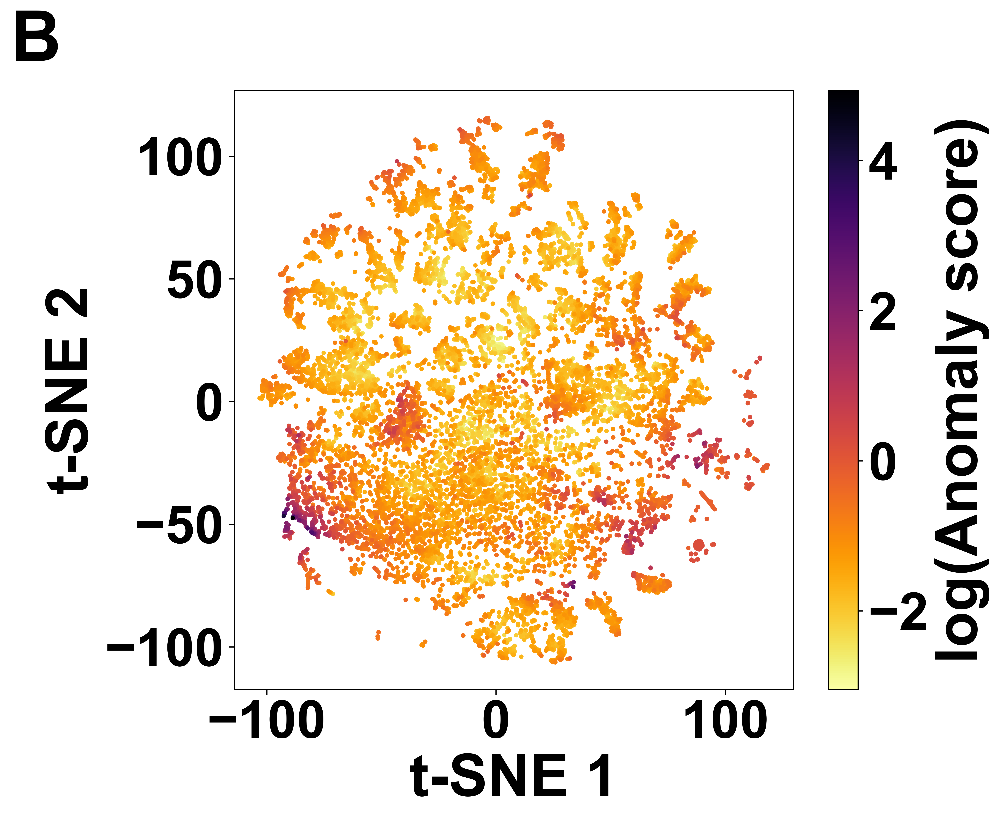

In [44]:
embedding_tsne= np.load('Dimention Reduction/embedding_tsne.npy')

sorted_embedding_tnse = embedding_tsne[sort_indices]
fig, ax = plt.subplots(figsize=(10, 8),dpi=600)
scatter=plt.scatter(sorted_embedding_tnse[:, 0], sorted_embedding_tnse[:, 1], 
                    c=np.log(sorted_scores),
                    cmap='inferno_r', alpha=1, s=4,rasterized=1)

for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_fontweight('bold')

ax.set_xlabel("t-SNE 1",fontweight='bold',color='black')

ax.set_ylabel("t-SNE 2",fontweight='bold',color='black')

cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label("log(Anomaly score)", fontweight='bold',color='black')
for label in cbar.ax.get_yticklabels():
    label.set_fontweight('bold')
    label.set_color('black')

    
plt.tight_layout(rect=[0, 0, 1, 1]) # rect=[left, bottom, right, top]
ax.text(-0.4, 1.05, 'B', transform=ax.transAxes,fontsize=m*12,  fontweight='bold')

plt.savefig(f'Dimention Reduction/fig4_tsne_map.pdf',bbox_inches='tight')



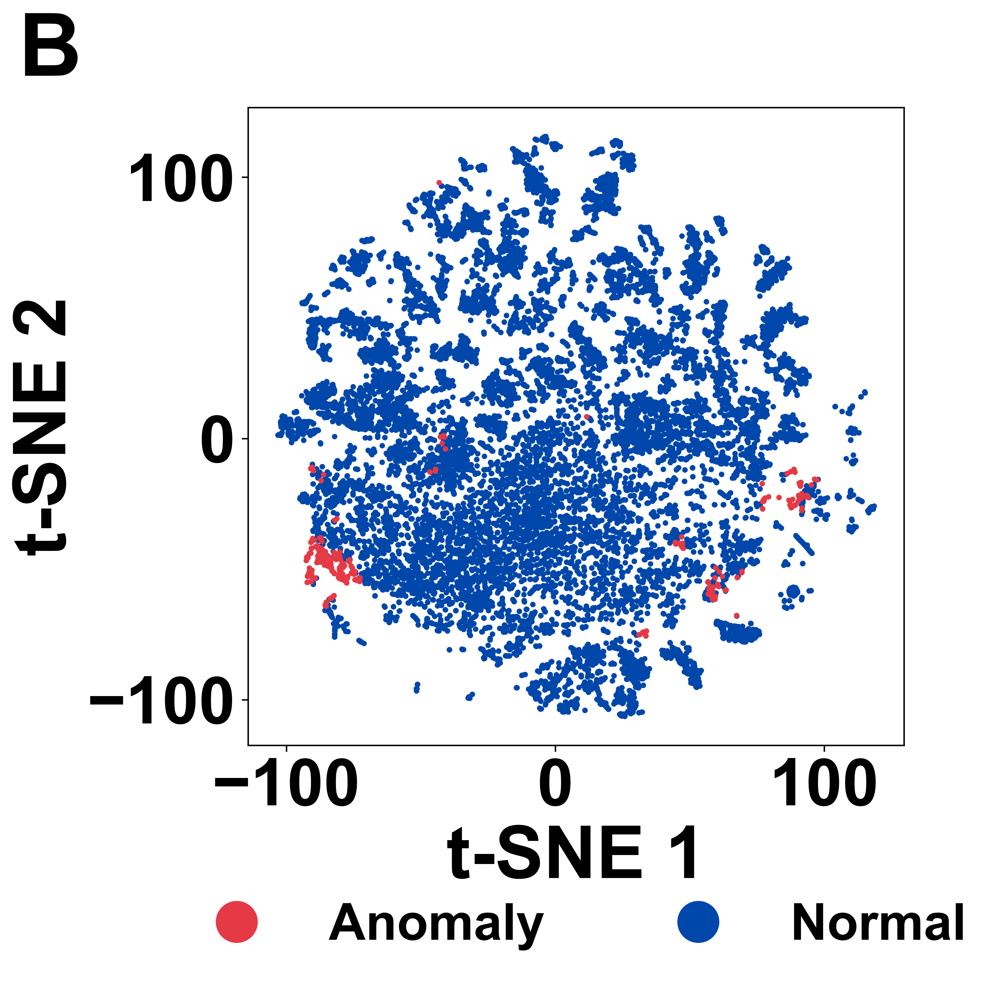

In [45]:
from matplotlib.lines import Line2D
fig, ax = plt.subplots(figsize=(8, 8),dpi=600)
scatter=plt.scatter(sorted_embedding_tnse[:, 0], sorted_embedding_tnse[:, 1], 
                    c=sorted_colors, alpha=1, s=4,rasterized=1)

for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_fontweight('bold')

ax.set_xlabel("t-SNE 1",fontweight='bold',color='black')

ax.set_ylabel("t-SNE 2",fontweight='bold',color='black')

legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Anomaly',
           markerfacecolor=color_anomaly, markersize=6*4),
    Line2D([0], [0], marker='o', color='w', label='Normal',
           markerfacecolor=color_normal, markersize=6*4)
]
ax.legend(
    handles=legend_elements,
    loc='upper center',         # Pin the legend from its top-center edge
    bbox_to_anchor=(0.5, -0.175),  # Position it at x=50%, y=-10% of the axes
    ncol=2,                     # Arrange legend items in 2 columns
    frameon=False,              # A frame often looks better when outside
    fontsize=7*m
)

# You might need to adjust plot margins to make space
plt.tight_layout(rect=[0, 0.0, 1, 1]) # rect=[left, bottom, right, top]
ax.text(-0.35, 1.05, 'B', transform=ax.transAxes,fontsize=m*12,  fontweight='bold')
plt.savefig(f'Dimention Reduction/fig4_tsne_category.pdf',bbox_inches='tight')

In [17]:
# reducer = umap.UMAP(
#         n_neighbors=10,
#         min_dist=0.99,
#         random_state=42,verbose=1
#     )
# embedding_umap = reducer.fit_transform(X_scaled)
# np.save('Dimention Reduction/embedding_umap.npy',embedding_umap)

C:\Users\KaraPardazesh\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP(min_dist=0.99, n_jobs=1, n_neighbors=10, random_state=42, verbose=1)
Fri Oct 24 11:56:52 2025 Construct fuzzy simplicial set
Fri Oct 24 11:56:52 2025 Finding Nearest Neighbors
Fri Oct 24 11:56:52 2025 Building RP forest with 13 trees
Fri Oct 24 11:57:07 2025 NN descent for 15 iterations
	 1  /  15
	 2  /  15
	 3  /  15
	 4  /  15
	Stopping threshold met -- exiting after 4 iterations
Fri Oct 24 11:57:34 2025 Finished Nearest Neighbor Search
Fri Oct 24 11:57:41 2025 Construct embedding


C:\Users\KaraPardazesh\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:328: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Fri Oct 24 11:58:14 2025 Finished embedding


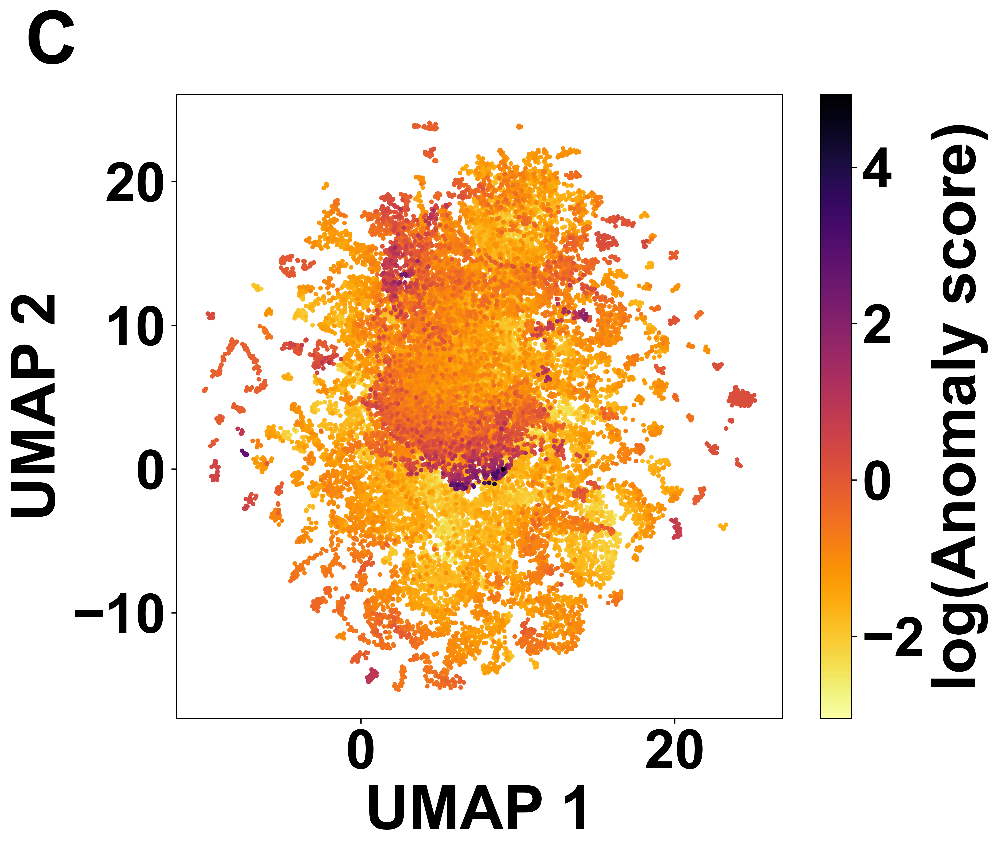

In [46]:

sorted_embedding_umap = embedding_umap[sort_indices]
fig, ax = plt.subplots(figsize=(10, 8),dpi=600)
scatter=plt.scatter(sorted_embedding_umap[:, 0], sorted_embedding_umap[:, 1],
                    c=np.log(sorted_scores),cmap='inferno_r', alpha=1, s=4,rasterized=1)

for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_fontweight('bold')

ax.set_xlabel("UMAP 1",fontweight='bold',color='black')

ax.set_ylabel("UMAP 2",fontweight='bold',color='black')

cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label("log(Anomaly score)", fontweight='bold',color='black')
for label in cbar.ax.get_yticklabels():
    label.set_fontweight('bold')
    label.set_color('black')

plt.tight_layout(rect=[0, 0.0, 1, 1]) # rect=[left, bottom, right, top]
ax.text(-0.25, 1.05, 'C', transform=ax.transAxes,fontsize=m*12,  fontweight='bold')
plt.savefig(f'Dimention Reduction/fig4_umap_map.pdf',bbox_inches='tight')



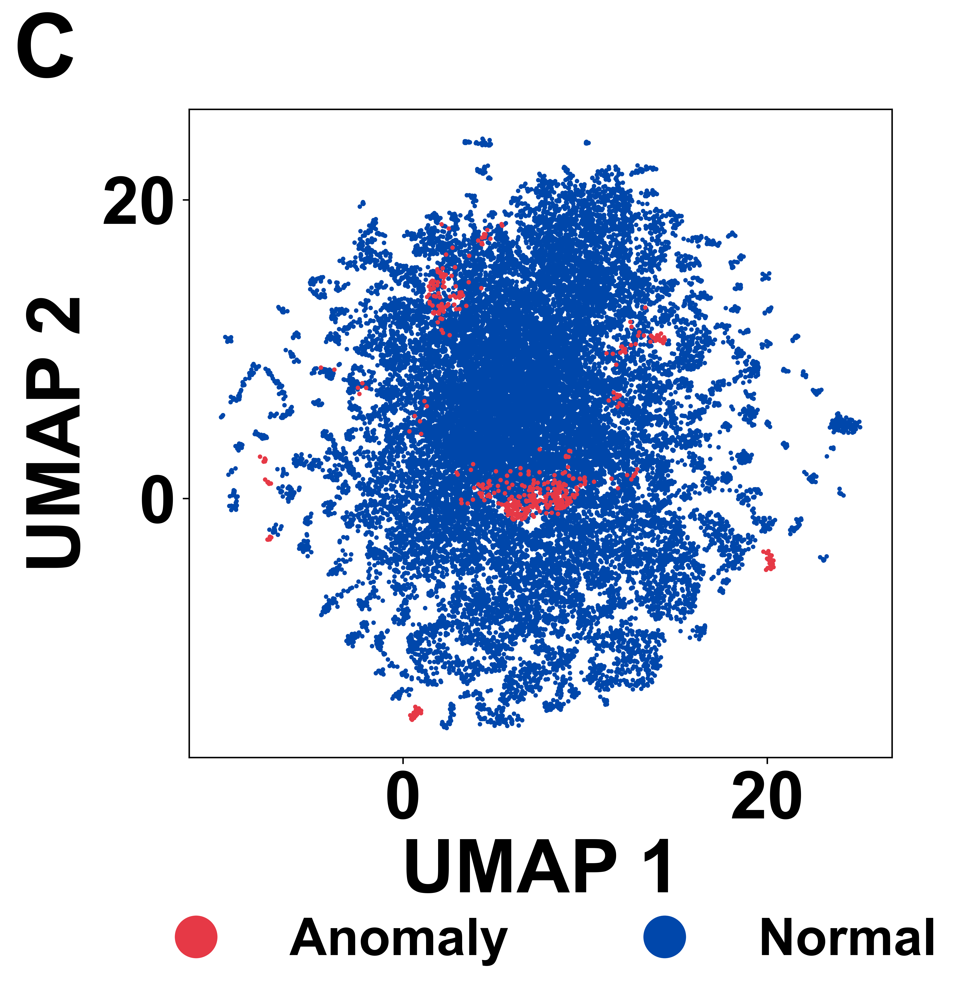

In [47]:
fig, ax = plt.subplots(figsize=(8, 8),dpi=600)
scatter=plt.scatter(sorted_embedding_umap[:, 0], sorted_embedding_umap[:, 1], 
                    c=sorted_colors, alpha=1, s=2,rasterized=1)

for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_fontweight('bold')

ax.set_xlabel("UMAP 1",fontweight='bold',color='black')

ax.set_ylabel("UMAP 2",fontweight='bold',color='black')


legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Anomaly',
           markerfacecolor=color_anomaly, markersize=6*4),
    Line2D([0], [0], marker='o', color='w', label='Normal',
           markerfacecolor=color_normal, markersize=6*4)
]
ax.legend(
    handles=legend_elements,
    loc='upper center',         # Pin the legend from its top-center edge
    bbox_to_anchor=(0.5, -0.175),  # Position it at x=50%, y=-10% of the axes
    ncol=2,                     # Arrange legend items in 2 columns
    frameon=False,              # A frame often looks better when outside
    fontsize=7*m
)

# You might need to adjust plot margins to make space
plt.tight_layout(rect=[0, 0, 1, 1]) # rect=[left, bottom, right, top]
ax.text(-0.25, 1.05, 'C', transform=ax.transAxes,fontsize=m*12,  fontweight='bold')

plt.savefig(f'Dimention Reduction/fig4_umap_category.pdf',bbox_inches='tight')